# Reading Your Geocoded Data

Get the data from here:
https://efif-my.sharepoint.com/:u:/g/personal/rhp_cphbusiness_dk/ERxmWZDsOJ1PhKpqAox16CgBhkfYc6YTh5susAMWXIHLbQ?e=nqgrxf

In [1]:
%matplotlib notebook


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# A CSV file containing all scraped data
complete_data = './data/boliga_all_loc.csv.bz2'

df = pd.read_csv(complete_data, compression='bz2')
df.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat
0,"Ved Volden 5, 5. TV",1425 København K,4000000,23-05-2017,Alm. Salg,43956.0,3.0,Lejlighed,91.0,1938.0,0.0,12.593629,55.671769
1,"Rådhusstræde 4C, 1",1466 København K,4895000,18-05-2017,Alm. Salg,46619.0,3.0,Lejlighed,105.0,1796.0,0.0,12.573689,55.676839
2,"Store Kongensgade 112A, 3",1264 København K,250000,15-05-2017,Andet,1851.0,2.0,Lejlighed,135.0,1860.0,0.0,12.590441,55.687079
3,"Amaliegade 13G, 2",1256 København K,7375000,15-05-2017,Alm. Salg,75255.0,3.0,Lejlighed,98.0,1948.0,9.0,12.591287,55.683439
4,"Borgergade 144, 3. TH",1300 København K,5825000,10-05-2017,Alm. Salg,57673.0,3.0,Lejlighed,101.0,1854.0,3.0,12.588744,55.687623


If you want to convert the `sell_date` column into a a proper `Datetime` object, you can do so via one of the following methods.

  * Let Pandas figure out in which form your dates are stored and parse them while reading the CSV file. **OBS**: This will take a bit for the entire dataset.

In [3]:
df = pd.read_csv(complete_data, compression='bz2', parse_dates=['sell_date'])
df.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat
0,"Ved Volden 5, 5. TV",1425 København K,4000000,2017-05-23,Alm. Salg,43956.0,3.0,Lejlighed,91.0,1938.0,0.0,12.593629,55.671769
1,"Rådhusstræde 4C, 1",1466 København K,4895000,2017-05-18,Alm. Salg,46619.0,3.0,Lejlighed,105.0,1796.0,0.0,12.573689,55.676839
2,"Store Kongensgade 112A, 3",1264 København K,250000,2017-05-15,Andet,1851.0,2.0,Lejlighed,135.0,1860.0,0.0,12.590441,55.687079
3,"Amaliegade 13G, 2",1256 København K,7375000,2017-05-15,Alm. Salg,75255.0,3.0,Lejlighed,98.0,1948.0,9.0,12.591287,55.683439
4,"Borgergade 144, 3. TH",1300 København K,5825000,2017-10-05,Alm. Salg,57673.0,3.0,Lejlighed,101.0,1854.0,3.0,12.588744,55.687623


  * Let Pandas figure out in which form your dates are stored and convert a column in an existing `DataFrame`.  **OBS**: This will take a bit for the entire dataset. 

In [4]:
pd.to_datetime(df['sell_date'])

0         2017-05-23
1         2017-05-18
2         2017-05-15
3         2017-05-15
4         2017-10-05
5         2017-10-05
6         2017-09-05
7         2017-08-05
8         2017-05-05
9         2017-04-05
10        2017-04-05
11        2017-03-05
12        2017-03-05
13        2017-02-05
14        2017-01-05
15        2017-01-05
16        2017-01-05
17        2017-01-05
18        2017-01-05
19        2017-01-05
20        2017-04-28
21        2017-04-27
22        2017-04-27
23        2017-04-27
24        2017-04-27
25        2017-04-27
26        2017-04-26
27        2017-04-26
28        2017-04-26
29        2017-04-25
             ...    
1385279   1992-04-14
1385280   1992-02-04
1385281   1992-03-26
1385282   1992-03-24
1385283   1992-03-23
1385284   1992-03-20
1385285   1992-03-19
1385286   1992-03-17
1385287   1992-03-17
1385288   1992-12-03
1385289   1992-09-03
1385290   1992-06-03
1385291   1992-04-03
1385292   1992-03-03
1385293   1992-02-26
1385294   1992-02-24
1385295   199

 * Specify in which format your dates are stored and parse them while reading the CSV file.

In [5]:
dateparse = lambda x: pd.datetime.strptime(x, '%d-%m-%Y')

# def dateparse(x):
#     return pd.datetime.strptime(x, '%d-%m-%Y')

df = pd.read_csv(complete_data, compression='bz2', parse_dates=['sell_date'], 
                 date_parser=dateparse)
df.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat
0,"Ved Volden 5, 5. TV",1425 København K,4000000,2017-05-23,Alm. Salg,43956.0,3.0,Lejlighed,91.0,1938.0,0.0,12.593629,55.671769
1,"Rådhusstræde 4C, 1",1466 København K,4895000,2017-05-18,Alm. Salg,46619.0,3.0,Lejlighed,105.0,1796.0,0.0,12.573689,55.676839
2,"Store Kongensgade 112A, 3",1264 København K,250000,2017-05-15,Andet,1851.0,2.0,Lejlighed,135.0,1860.0,0.0,12.590441,55.687079
3,"Amaliegade 13G, 2",1256 København K,7375000,2017-05-15,Alm. Salg,75255.0,3.0,Lejlighed,98.0,1948.0,9.0,12.591287,55.683439
4,"Borgergade 144, 3. TH",1300 København K,5825000,2017-05-10,Alm. Salg,57673.0,3.0,Lejlighed,101.0,1854.0,3.0,12.588744,55.687623


# A bit more of preprocessing...

Again, we would like to have for each sales record an integer number for the zip code, so that we can use those values for boolean indexing.

In [7]:
df['zip_nr'] = [int(el.split(' ')[0]) 
                for el in df['zip_code'].values]

Futhermore, we would like an extra column containing the sales year.

Note, in case you did not convert the `sell_date` to proper `Datetime` objects you would have to treat them as strings as in the follwing.

```python
df['sell_year'] = [int(el.split('-')[-1]) 
                   for el in df['sell_date'].values] 
```


In [9]:
df['sell_year'] = df['sell_date'].dt.year

In [10]:
df.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat,zip_nr,sell_year
0,"Ved Volden 5, 5. TV",1425 København K,4000000,2017-05-23,Alm. Salg,43956.0,3.0,Lejlighed,91.0,1938.0,0.0,12.593629,55.671769,1425,2017
1,"Rådhusstræde 4C, 1",1466 København K,4895000,2017-05-18,Alm. Salg,46619.0,3.0,Lejlighed,105.0,1796.0,0.0,12.573689,55.676839,1466,2017
2,"Store Kongensgade 112A, 3",1264 København K,250000,2017-05-15,Andet,1851.0,2.0,Lejlighed,135.0,1860.0,0.0,12.590441,55.687079,1264,2017
3,"Amaliegade 13G, 2",1256 København K,7375000,2017-05-15,Alm. Salg,75255.0,3.0,Lejlighed,98.0,1948.0,9.0,12.591287,55.683439,1256,2017
4,"Borgergade 144, 3. TH",1300 København K,5825000,2017-05-10,Alm. Salg,57673.0,3.0,Lejlighed,101.0,1854.0,3.0,12.588744,55.687623,1300,2017


In [11]:
mask = ((df['zip_nr'] < 4800) & 
        (df['sell_year'] <= 2005) & 
        (df['sell_year'] >= 2000))
df_zealand_00_05 = df[mask]
df_zealand_00_05.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat,zip_nr,sell_year
4608,"Lille Strandstræde 20, 2. TV",1254 København K,7500000,2005-12-29,Alm. Salg,29527.0,7.0,Lejlighed,254.0,1778.0,0.0,12.590218,55.681210,1254,2005
4609,"Wildersgade 2A, ST. TV",1408 København K,3595000,2005-12-27,Alm. Salg,34902.0,3.0,Lejlighed,103.0,2001.0,0.0,12.587217,55.671201,1408,2005
4610,"Hammershøis Kaj 10, 5. TV",1402 København K,4900000,2005-12-25,Alm. Salg,41176.0,4.0,Lejlighed,119.0,2003.0,0.0,12.585575,55.671854,1402,2005
4611,"Store Kongensgade 92B, 5",1264 København K,4200000,2005-12-24,Alm. Salg,42000.0,2.0,Lejlighed,100.0,1865.0,0.0,12.589446,55.685875,1264,2005
4612,"Amaliegade 13B, 6. TH",1256 København K,6000000,2005-12-23,Alm. Salg,43165.0,3.0,Lejlighed,139.0,1962.0,0.0,12.591639,55.683038,1256,2005


## Scatter Plots

If you wanted to get a first impression for the locations for which we have sales records, you could plot the latitude and longitude values in a two-dimensional plot, where each location is a dot.

<IPython.core.display.Javascript object>


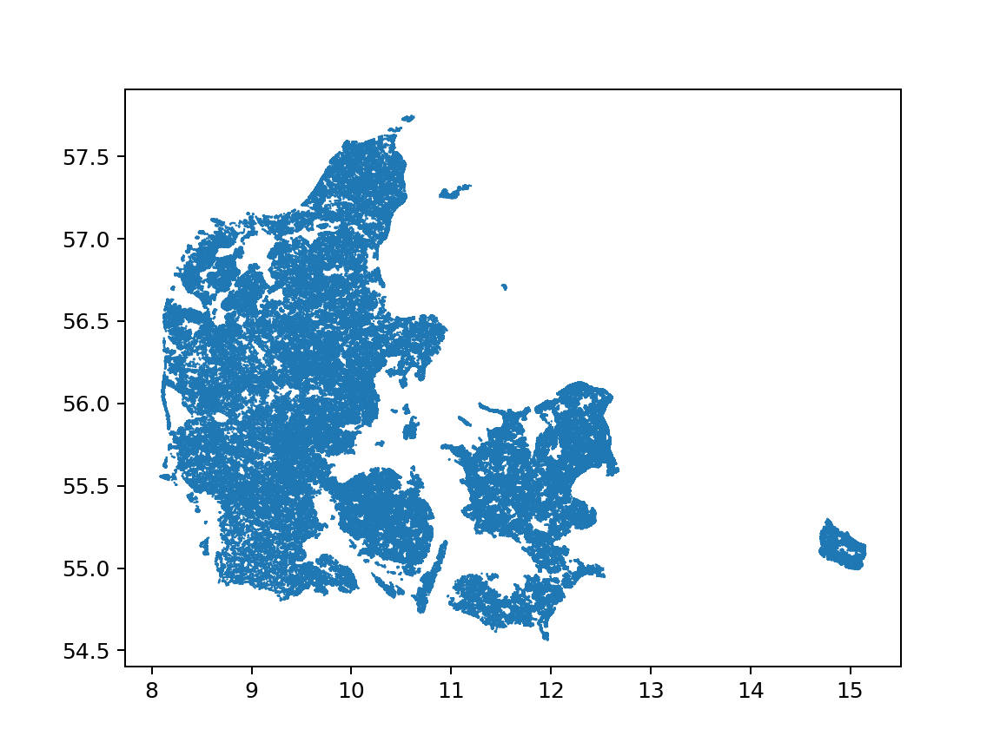

In [12]:
%matplotlib notebook


x_values = df['lon']
y_values = df['lat']

plt.scatter(x_values, y_values, s=1, edgecolor='none')

Note, that these plots are not really well suited for geographical data as they just plot raw value combinations. There is no information carried about a suitable projection, see https://en.wikipedia.org/wiki/Map_projection. 

<IPython.core.display.Javascript object>


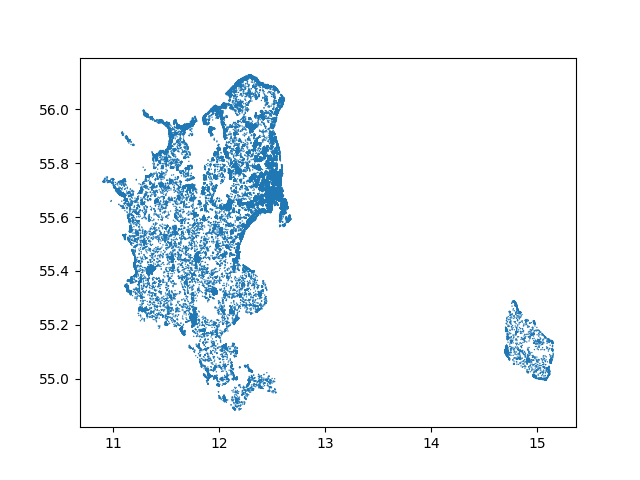

In [43]:
%matplotlib notebook


x_values = df_zealand_00_05['lon']
y_values = df_zealand_00_05['lat']

plt.scatter(x_values, y_values, s=1, edgecolor='none')

You can modify the same plot, by just adding more values to it as in the following. 

<IPython.core.display.Javascript object>


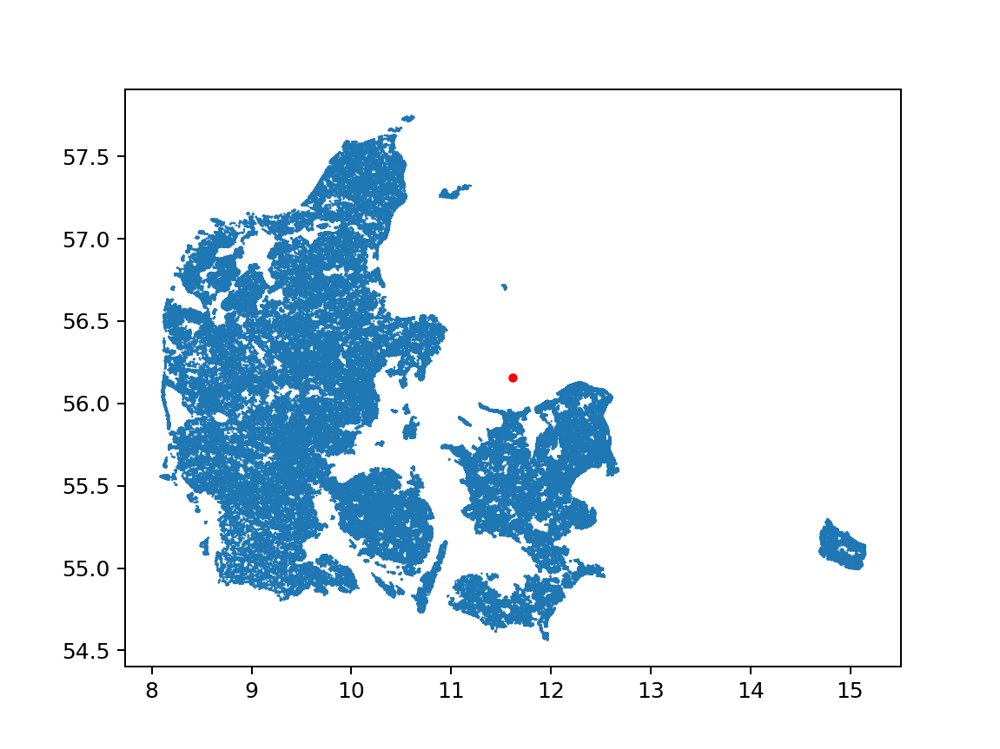

In [13]:
%matplotlib notebook


x_values = df['lon']
y_values = df['lat']

plt.scatter(x_values[:], y_values[:], s=1, edgecolor='none')

center_x = x_values.min() + (x_values.max() - x_values.min()) / 2
center_y = y_values.min() + (y_values.max() - y_values.min()) * 0.5

plt.scatter(center_x, center_y, s=10, c='red')

## Color


We use the Haversine Distance (https://en.wikipedia.org/wiki/Haversine_formula) to compute an array of distance values, which we use for color coding.

In [14]:
import math


def haversine_distance(origin, destination):

    lat_orig, lon_orig = origin
    lat_dest, lon_dest = destination
    radius = 6371

    dlat = math.radians(lat_dest-lat_orig)
    dlon = math.radians(lon_dest-lon_orig)
    a = (math.sin(dlat / 2) * math.sin(dlat / 2) + math.cos(math.radians(lat_orig)) 
        * math.cos(math.radians(lat_dest)) * math.sin(dlon / 2) * math.sin(dlon / 2))
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = radius * c

    return d


distances = [haversine_distance((center_x, center_y), el) 
             for el in df[['lon', 'lat']].values]

<IPython.core.display.Javascript object>


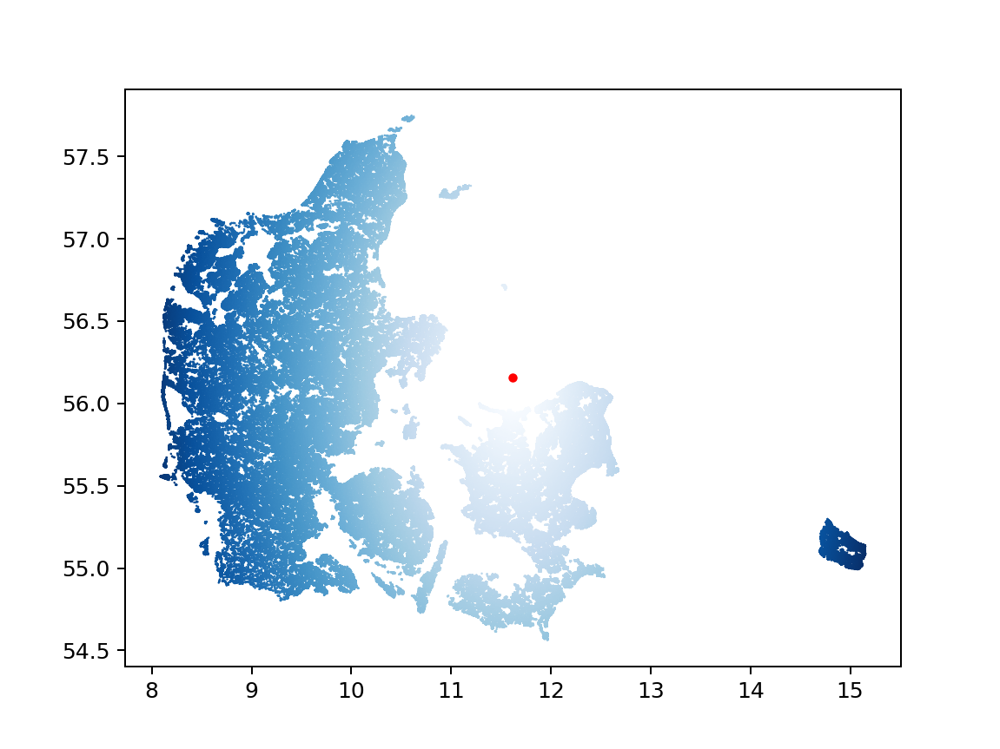

In [15]:
%matplotlib notebook


x_values = df['lon']
y_values = df['lat']

plt.scatter(x_values, y_values, s=1, c=distances, 
            cmap=plt.cm.Blues, edgecolor='none')
plt.scatter(center_x, center_y, s=10, c='red')

In [16]:
import math


def distance(origin, destination):

    lat_orig, lon_orig = origin
    lat_dest, lon_dest = destination

    dlat = lat_dest - lat_orig
    dlon = lon_dest - lon_orig

    d = math.sqrt(dlat ** 2 + dlon ** 2)

    return d


distances = [distance((center_x, center_y), el) 
             for el in df[['lon', 'lat']].values]

<IPython.core.display.Javascript object>


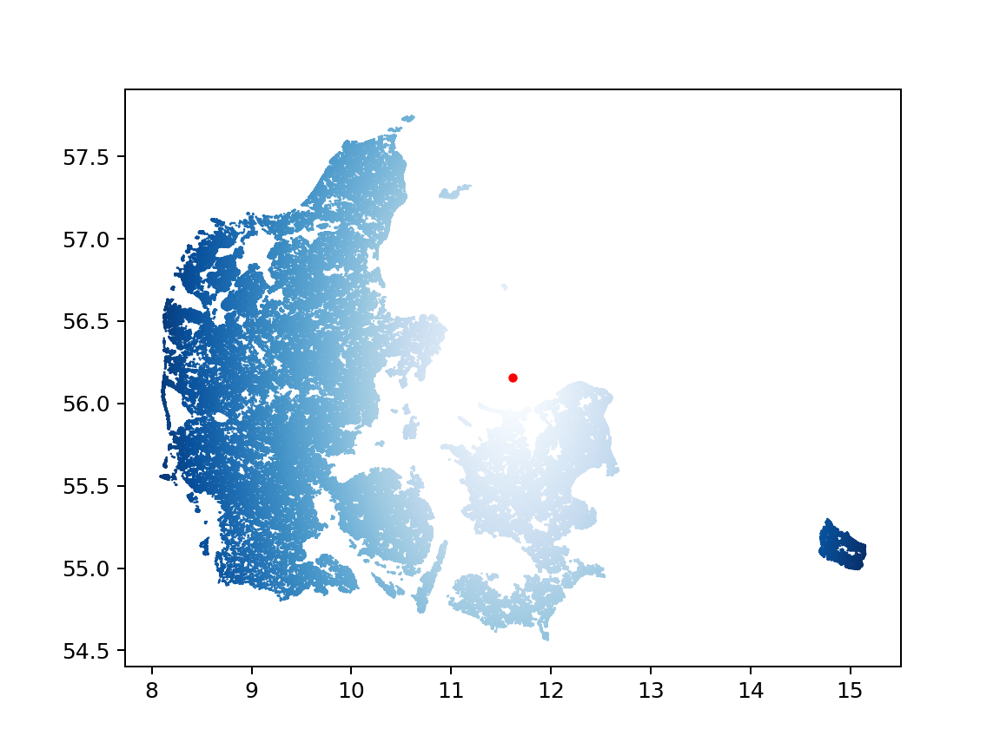

In [17]:
%matplotlib notebook


x_values = df['lon']
y_values = df['lat']

plt.scatter(x_values[:], y_values[:], s=1, c=distances, 
            cmap=plt.cm.Blues, edgecolor='none')
plt.scatter(center_x, center_y, s=10, c='red')

## Line Plots

Line plots are a good tool for visualizing trends from one value to another. For example, let's create a line plot which compares the number of rooms to the average and median price per square meter.

In [88]:
df_small = df_zealand_00_05
mask = ((df_small.sell_year == 2003) & 
        (~df_small['no_rooms'].isnull()))
no_rooms_series = df_small[mask]['no_rooms']
no_rooms = no_rooms_series.unique()
no_rooms.sort()
no_rooms

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 19., 24.])

In [89]:
stats = [(no,
          df_small[(df_small['no_rooms'] == no)]['price_per_sq_m'].mean(), 
          df_small[(df_small['no_rooms'] == no)]['price_per_sq_m'].median()) 
         for no in no_rooms]


df_stats = pd.DataFrame(stats, columns=['no_rooms', 'mean_price', 'median_price'])
df_stats

,no_rooms,mean_price,median_price
0,1.0,18580.696889,16241.0
1,2.0,16978.295388,16153.0
2,3.0,14803.107835,13775.5
3,4.0,13141.826307,12411.0
4,5.0,12332.606401,11706.0
5,6.0,12083.298094,11200.5
6,7.0,12059.982481,10714.0
7,8.0,11930.370899,10348.5
8,9.0,11917.357047,9502.0
9,10.0,11773.083067,10084.0


<IPython.core.display.Javascript object>


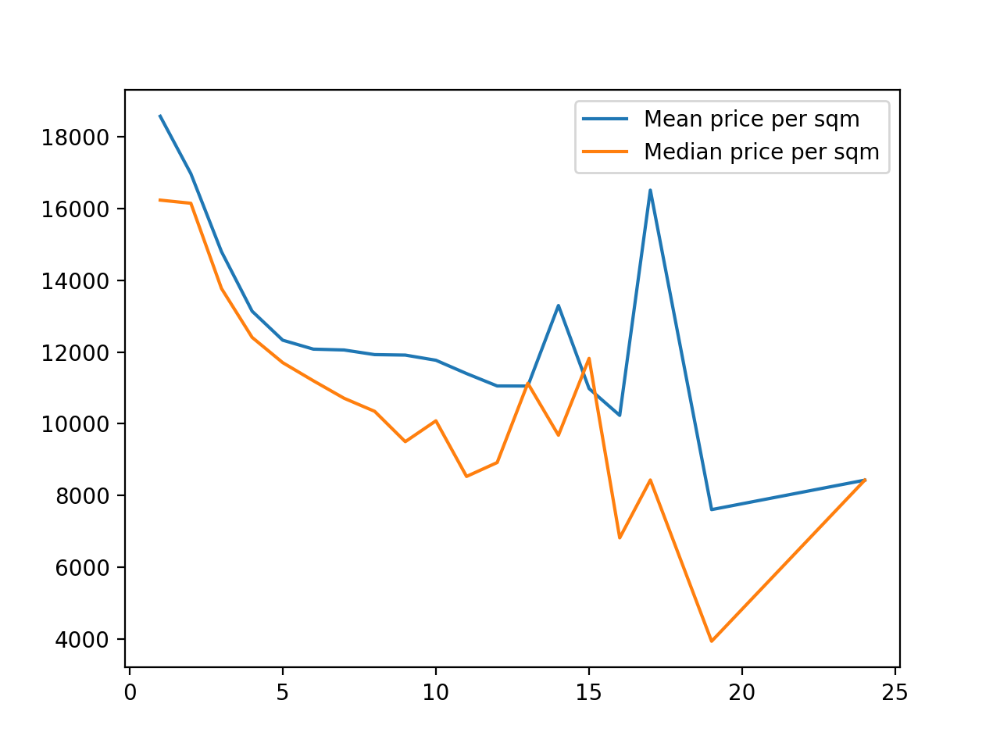

In [91]:
%matplotlib notebook


plt.plot(df_stats.no_rooms, df_stats.mean_price, 
         label="Mean price per sqm")
plt.plot(df_stats.no_rooms, df_stats.median_price, 
         label="Median price per sqm")
plt.legend()

What can you read out of the plot above?

### A side note on sorting values...

You can sort your `DataFrame` for example with the help of the `sort_values` method.

In [20]:
df_stats.sort_values(by='mean_price')

,no_rooms,mean_price,median_price
22,23,1710.000000,1710.0
21,22,3438.000000,3438.0
19,20,6504.000000,6504.0
18,19,7606.333333,3934.0
17,18,8444.000000,10351.0
15,16,10235.333333,6818.0
14,15,10983.705882,11826.0
12,13,11054.000000,11131.0
11,12,11056.240964,8920.0
10,11,11402.160839,8532.0


In [ ]:
df_stats.sort_values(by='mean_price', inplace=True)

## Bar Plots

<IPython.core.display.Javascript object>


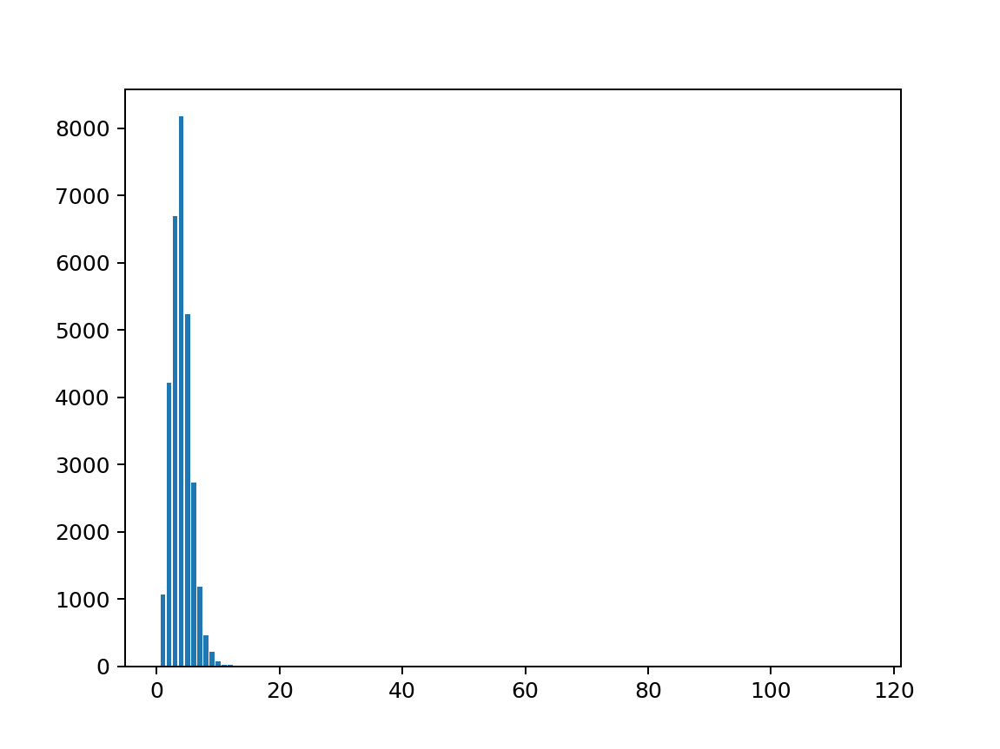

<Container object of 27 artists>

In [21]:
%matplotlib notebook


from collections import Counter


mask = ((df_zealand_00_05['sell_year'] == 2005) &
        (~df_zealand_00_05['no_rooms'].isnull()))
no_rooms = df_zealand_00_05[mask]['no_rooms']

no_room_freq_count = Counter(no_rooms)
no_room_freq = list(no_room_freq_count.values())
no_rooms = list(no_room_freq_count.keys())

plt.bar(no_rooms, no_room_freq)


Since bar plots are most often used for plotting hsitograms, you can also resort to the `hist` function, which comutes the histogram in the background for you.

<IPython.core.display.Javascript object>


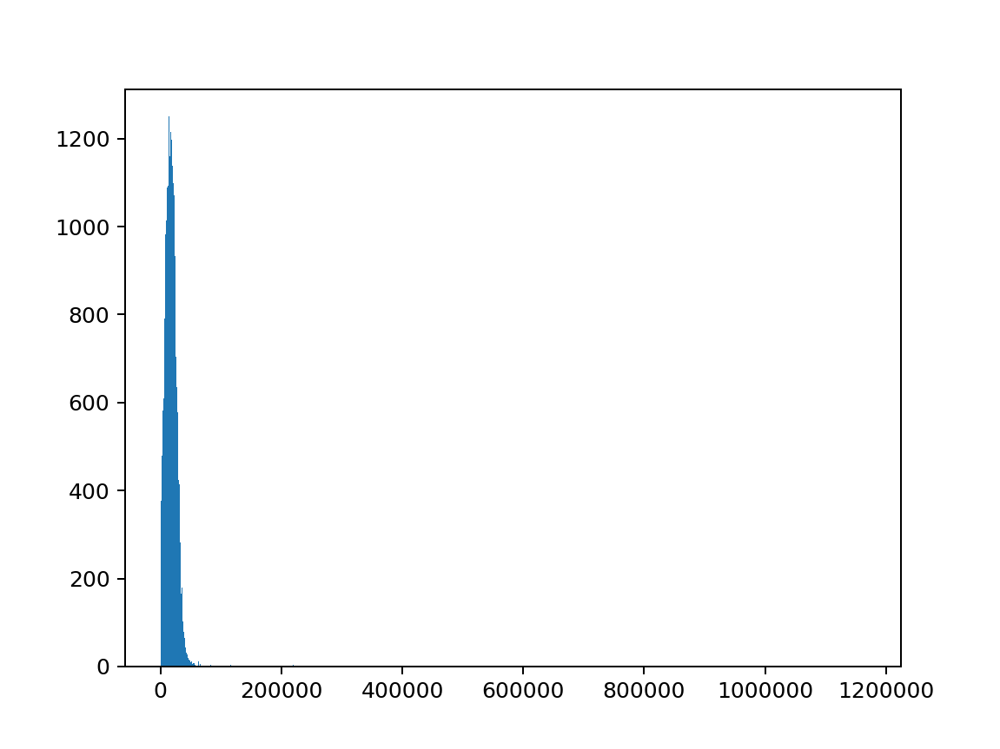

(array([138., 377., 479., ...,   0.,   0.,   2.]),
 array([     20,    1020,    2020, ..., 1164020, 1165020, 1166020]),
 <a list of 1166 Patch objects>)

In [22]:
%matplotlib notebook


mask = ((df_zealand_00_05['sell_year'] == 2005) &
        (~df_zealand_00_05['price_per_sq_m'].isnull()))
prices = df_zealand_00_05[mask]['price_per_sq_m']
binwidth = 1000
plt.hist(prices, bins=range(int(prices.min()), 
                            int(prices.max() + binwidth), binwidth))

# Your Turn!

![](https://camo.githubusercontent.com/320b4791da998fd94e34ad4a85d44d8d5a581ca4/68747470733a2f2f732d6d656469612d63616368652d616b302e70696e696d672e636f6d2f6f726967696e616c732f39662f37332f65332f39663733653366386139353864626530336230663736663838313161353461312e676966)


We get all steps of this weeks assignment to run!

You will need some of the files for next week. In case you have a working solution we try to make your code more short, effective, good looking, and easily runable.

# Plotting Geographic Data with `Basemap`s


If you want to plot your data, which contains geo-locations with with a proper projection onto a plane, then you might want to have a look on the `Basemap` class.

```bash
$ conda install basemap
```

<IPython.core.display.Javascript object>


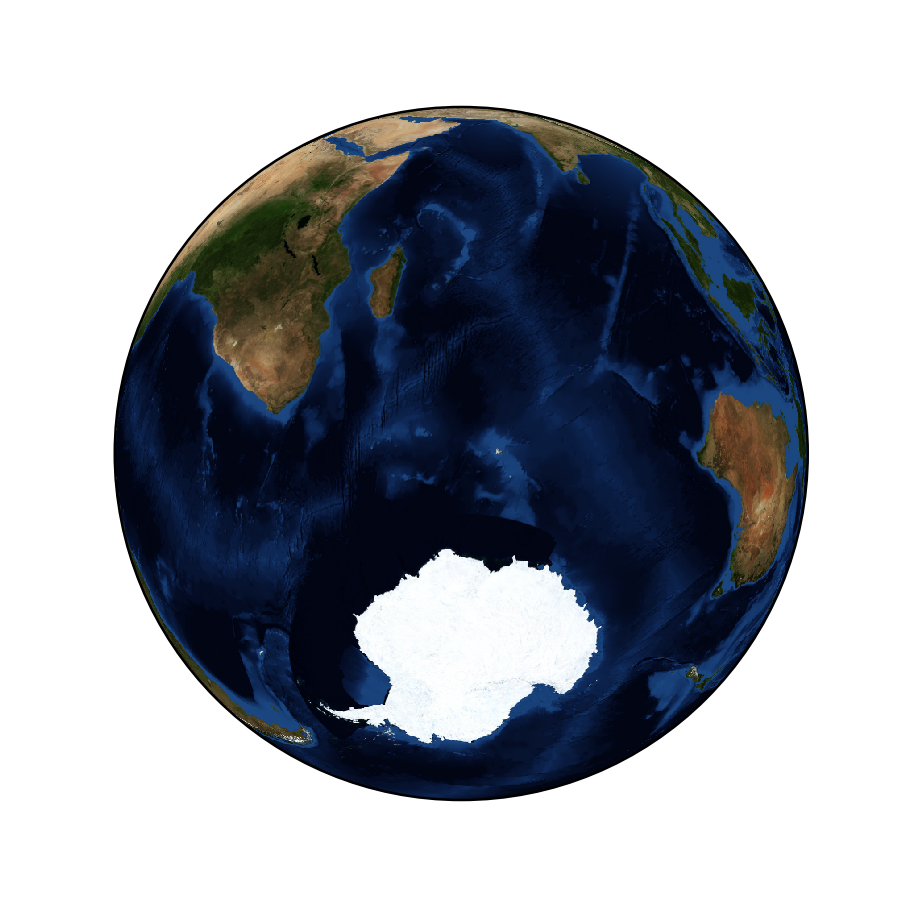

In [24]:
%matplotlib notebook


import warnings
warnings.filterwarnings('ignore')
from mpl_toolkits.basemap import Basemap


plt.figure(figsize=(5, 5))
m = Basemap(projection='ortho', resolution=None, lat_0=-50, lon_0=60)
m.bluemarble(scale=0.5)

Lambert conformal conic projection https://en.wikipedia.org/wiki/Lambert_conformal_conic_projection

<IPython.core.display.Javascript object>


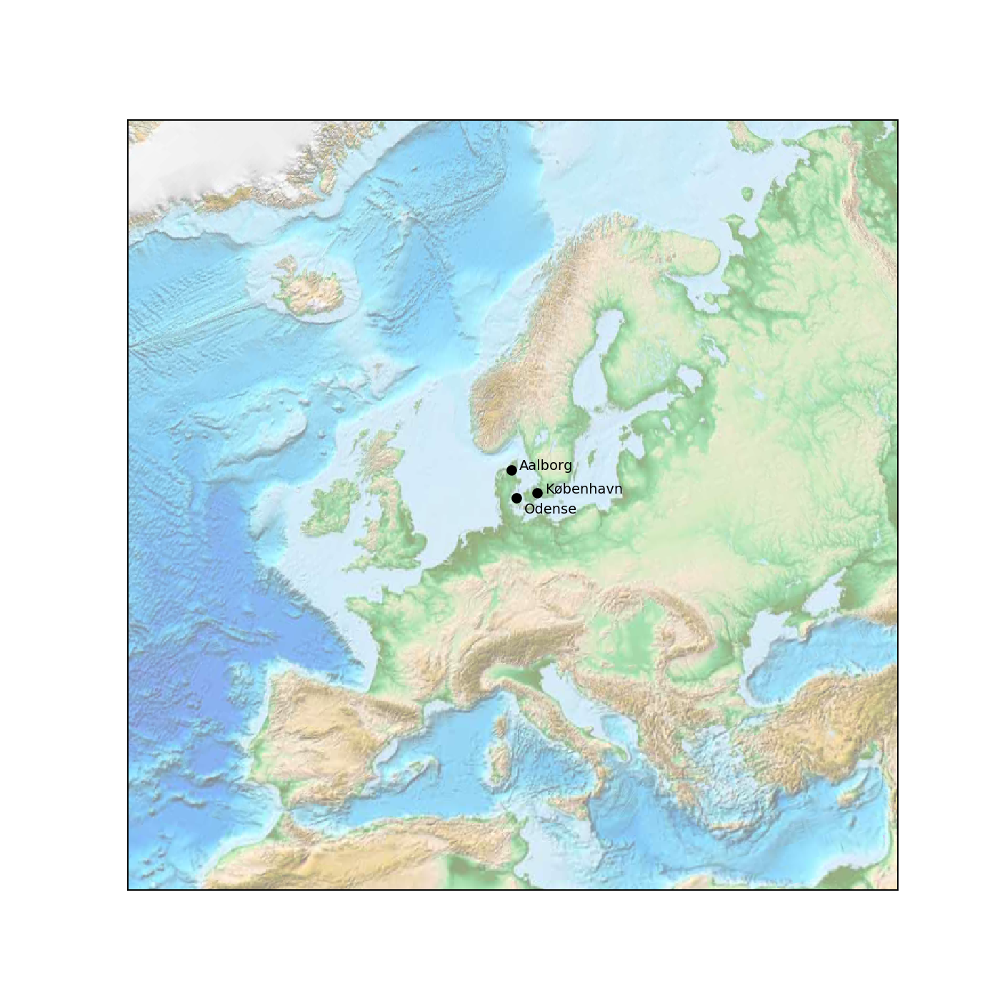

In [93]:
%matplotlib notebook


fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution=None,
            width=5000000, height=5000000, 
            lat_0=55, lon_0=10,)
m.etopo(scale=1.0, alpha=0.5)

# Map (long, lat) to (x, y) for plotting
coords = {'København': (55.676111, 12.568333), 
          'Odense': (55.395833, 10.388611), 
          'Aalborg': (57.05, 9.916667)}

for city, coord in coords.items():
    y_adjust = 100000 if city is 'Odense' else 0
    
    x, y = m(coord[1], coord[0])
    plt.plot(x, y, 'ok', markersize=5)
    
    plt.text(x + 50000, y - y_adjust, city, fontsize=8)


Mercator projection https://en.wikipedia.org/wiki/Mercator_projection

In [26]:
mask = ((~df_zealand_00_05.lat.isnull()) & 
        (~df_zealand_00_05.lon.isnull()) & 
        (df_zealand_00_05.no_rooms >= 5))
df_zealand_00_05_large = df_zealand_00_05[mask]

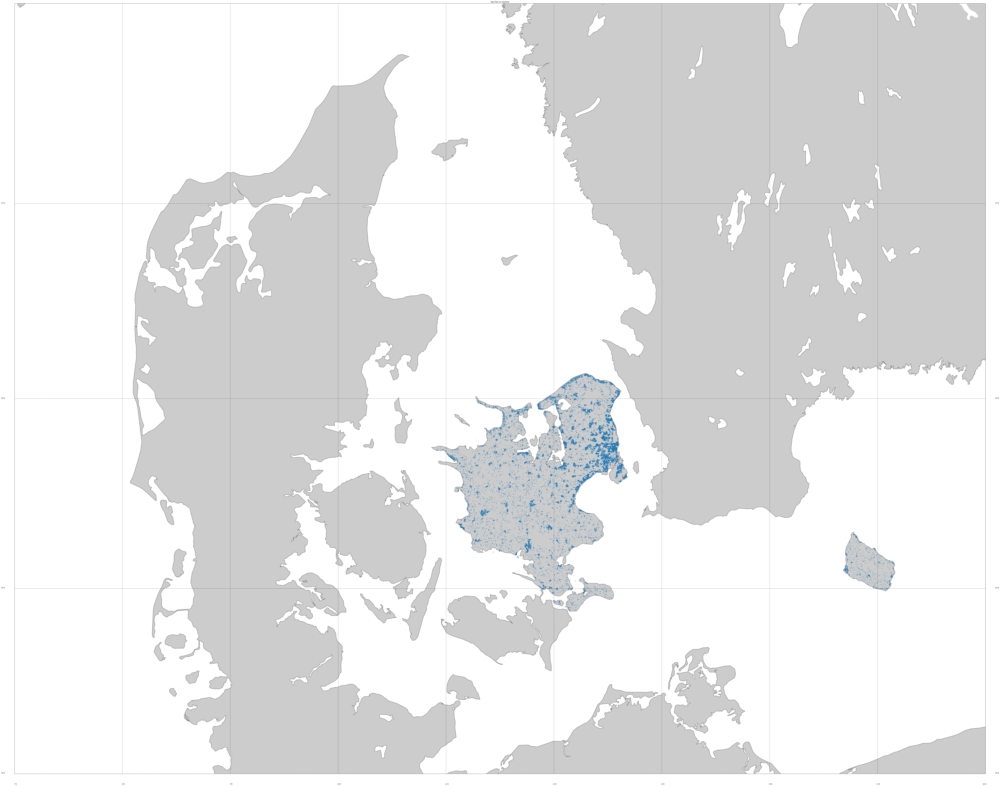

In [27]:
%matplotlib inline


# create new figure, axes instances.
fig = plt.figure()
ax = fig.add_axes([x_values.min(), y_values.min(), 
                   x_values.max(), y_values.max()])

# setup mercator map projection.
m = Basemap(llcrnrlon=7., llcrnrlat=54., 
            urcrnrlon=16., urcrnrlat=58.,
            rsphere=(6378137.00, 6356752.3142),
            resolution='h', projection='merc',
            lat_0=40., lon_0=-20., lat_ts=20.)

m.drawcoastlines()
m.fillcontinents(zorder=0)
m.scatter(df_zealand_00_05_large.lon.values, 
          df_zealand_00_05_large.lat.values, 
          3, marker='o', latlon=True)

# draw parallels
m.drawparallels(np.arange(10, 90,  1), 
                labels=[1, 1, 0, 1])
# draw meridians
m.drawmeridians(np.arange(-180, 180, 1), 
                labels=[1, 1, 0, 1])
ax.set_title('Big Flats on Zealand')
plt.show()

# Plotting Geodata with `folium`

The above `Basemap` plots are nice. However, they are static images. In case you want to create plots for the web, you might want to have a look on the `folium` module, see http://folium.readthedocs.io/en/latest/, which is a Python wrapper for `Leaflet` http://leafletjs.com.

```bash
$ pip install folium
```

In [94]:
from datetime import date
from datetime import datetime


mask = ((~df_zealand_00_05.lat.isnull()) & 
        (~df_zealand_00_05.lon.isnull()) & 
        (df_zealand_00_05.no_rooms >= 6) &
        (df_zealand_00_05.sell_date >= datetime(2003, 3, 24)) & 
        (df_zealand_00_05.sell_date <= datetime(2003, 9, 15))
       )
df_zealand_00_05_large = df_zealand_00_05[mask]
df_zealand_00_05_large

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat,zip_nr,sell_year,zip_strings
5082,"Sølvgade 26, 3",1307 København K,1800000,2003-09-02,Fam. Salg,7438.0,7.0,Lejlighed,242.0,1857.0,0.0,12.581788,55.686680,1307,2003,1000-1499
9383,"Oehlenschlægersgade 3, 3",1663 København V,833333,2003-08-19,Alm. Salg,4844.0,7.0,Lejlighed,172.0,1859.0,0.0,12.549890,55.672155,1663,2003,1500-1799
9386,"Vesterbrogade 85, 1",1620 København V,6350000,2003-08-08,Alm. Salg,46350.0,6.0,Lejlighed,137.0,1859.0,0.0,12.548071,55.672070,1620,2003,1500-1799
9387,"Reventlowsgade 26, 3. TH",1651 København V,2400000,2003-08-06,Alm. Salg,15686.0,6.0,Lejlighed,153.0,1888.0,0.0,12.564532,55.671186,1651,2003,1500-1799
13096,"Oehlenschlægersgade 3, 3",1663 København V,833333,2003-08-19,Alm. Salg,4844.0,7.0,Lejlighed,172.0,1859.0,0.0,12.549890,55.672155,1663,2003,1500-1799
13099,"Vesterbrogade 85, 1",1620 København V,6350000,2003-08-08,Alm. Salg,46350.0,6.0,Lejlighed,137.0,1859.0,0.0,12.548071,55.672070,1620,2003,1500-1799
13100,"Reventlowsgade 26, 3. TH",1651 København V,2400000,2003-08-06,Alm. Salg,15686.0,6.0,Lejlighed,153.0,1888.0,0.0,12.564532,55.671186,1651,2003,1500-1799
16918,"Kochsvej 2, 2. TV",1812 Frederiksberg C,2255000,2003-09-02,Alm. Salg,15340.0,6.0,Lejlighed,147.0,1906.0,0.0,12.537856,55.673789,1812,2003,1800-1899
16922,"Sankt Markus Alle 4, 1. TH",1922 Frederiksberg C,1997500,2003-08-25,Fam. Salg,13775.0,6.0,Lejlighed,145.0,1902.0,0.0,12.554304,55.680018,1922,2003,1922
16923,"Sankt Markus Alle 4, 2. TH",1922 Frederiksberg C,977500,2003-08-25,Fam. Salg,6741.0,6.0,Lejlighed,145.0,1902.0,0.0,12.554304,55.680018,1922,2003,1922


In [95]:
import folium


my_map = folium.Map(location=[55.88207495748612, 10.636574309440173], zoom_start=6)

for coords in zip(df_zealand_00_05_large.lon.values, 
                  df_zealand_00_05_large.lat.values):
    folium.CircleMarker(location=[coords[1], coords[0]], radius=2).add_to(my_map)
my_map.save('data/large_flat_trades.html')
my_map

In [31]:
%%bash

ls -ltrh data/large_flat_trades.html

-rw-r--r--  1 rhp  staff   932K Sep 12 14:40 data/large_flat_trades.html


In [96]:
%%bash

tail -70 data/large_flat_trades.html

                )
                .addTo(map_b2ddf1d6591b4a009a12680c4c51f934);
            
    
            var circle_marker_3269619731f04647949d034687978de0 = L.circleMarker(
                [54.966837, 12.49239],
                {
  "bubblingMouseEvents": true,
  "color": "#3388ff",
  "dashArray": null,
  "dashOffset": null,
  "fill": false,
  "fillColor": "#3388ff",
  "fillOpacity": 0.2,
  "fillRule": "evenodd",
  "lineCap": "round",
  "lineJoin": "round",
  "opacity": 1.0,
  "radius": 2,
  "stroke": true,
  "weight": 3
}
                )
                .addTo(map_b2ddf1d6591b4a009a12680c4c51f934);
            
    
            var circle_marker_2d6e4a107d5b49cc815106395a3f813d = L.circleMarker(
                [54.993559, 12.453099],
                {
  "bubblingMouseEvents": true,
  "color": "#3388ff",
  "dashArray": null,
  "dashOffset": null,
  "fill": false,
  "fillColor": "#3388ff",
  "fillOpacity": 0.2,
  "fillRule": "evenodd",
  "lineCap": "round",
  "lineJoin": "round"

### GeoJson File for Danish Postnumre Data

I got it from https://github.com/ok-dk/dagi, which says that the data is originally from Geodatastyrelsen and Danske Kommuner.

In [33]:
%%bash
wget https://raw.githubusercontent.com/ok-dk/dagi/master/geojson/postnumre.geojson

--2018-09-12 14:40:37--  https://raw.githubusercontent.com/ok-dk/dagi/master/geojson/postnumre.geojson
Resolving raw.githubusercontent.com... 151.101.84.133
Connecting to raw.githubusercontent.com|151.101.84.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2924598 (2.8M) [text/plain]
Saving to: ‘postnumre.geojson’

     0K .......... .......... .......... .......... ..........  1% 1.95M 1s
    50K .......... .......... .......... .......... ..........  3% 2.98M 1s
   100K .......... .......... .......... .......... ..........  5% 9.42M 1s
   150K .......... .......... .......... .......... ..........  7% 4.59M 1s
   200K .......... .......... .......... .......... ..........  8% 6.63M 1s
   250K .......... .......... .......... .......... .......... 10% 11.9M 1s
   300K .......... .......... .......... .......... .......... 12% 13.0M 1s
   350K .......... .......... .......... .......... .......... 14% 4.51M 1s
   400K .......... .......... .......... .....

In [34]:
%%bash

ls -ltrh postnumre.geojson

-rw-r--r--  1 rhp  staff   2.8M Sep 12 14:40 postnumre.geojson


In [97]:
import os
import json
import folium
import requests


def get_geojson(url):
    local_file = os.path.basename(url)
    if os.path.isfile(local_file):
        # if file exists locally load it
        with open(local_file, encoding='utf-8') as f: 
            geo_json = json.load(f)
    else:
        # otherwise read it from remote
        response = requests.get(url)
        geo_json = response.json()
    return geo_json


def get_city_location(city='Copenhagen'):
    """Get the location coordinates from OpenStreetMaps"""
    url_nomatim_api = 'https://nominatim.openstreetmap.org/search'
    r = requests.get(url_nomatim_api, params={'format': 'json', 'city': 'Copenhagen'})
    results = r.json()  # Potentially many matches
    
    location = results[0]
    lat, lon = float(location['lat']), float(location['lon'])
    return lat, lon


url = "https://raw.githubusercontent.com/ok-dk/dagi/master/geojson/postnumre.geojson"
geo_json = get_geojson(url)

lat, lon = get_city_location(city='Helsingør')
map_osm = folium.Map(location=(lat, lon), zoom_start=6)
folium.GeoJson(geo_json, name='geojson').add_to(map_osm)
map_osm.save('./osm2.html')
map_osm

## Filtering a GeoJSON File

In [41]:
%%bash
ls -ltrh postnumre.geojson

-rw-r--r--  1 rhp  staff   2.8M Sep 12 14:40 postnumre.geojson


In [43]:
%%bash
head postnumre.geojson

{
"type": "FeatureCollection",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
                                                                                
"features": [
{ "type": "Feature", "properties": { "POSTNR_TXT": "2800", "POSTBYNAVN": "Kongens Lyngby" }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 12.504553413144006, 55.800830125393091, -999.0 ], [ 12.523895668675651, 55.804436745965319, -999.0 ], [ 12.527851772247455, 55.802542061654925, -999.0 ], [ 12.545023672750917, 55.803481284446761, -999.0 ], [ 12.553750246024453, 55.808907318363353, -999.0 ], [ 12.564300698084978, 55.81012042180155, -999.0 ], [ 12.566062319666027, 55.808321679099691, -999.0 ], [ 12.569560386305232, 55.809724204069944, -999.0 ], [ 12.577613691073161, 55.808232436685813, -999.0 ], [ 12.582790518917809, 55.802609019716009, -999.0 ], [ 12.577657301628204, 55.802774918310242, -999.0 ], [ 12.579757252225203, 55.7960132963915, -999.0 ], [ 12.547167865259262, 

In [44]:
import json


geo_json_zealand = {}

geo_json_zealand['type'] = geo_json['type']
geo_json_zealand['crs'] = geo_json['crs']
geo_json_zealand['features'] = []

for feature in geo_json['features']:
    if '-' in feature['properties']['POSTNR_TXT']:
        zip_code = int(feature['properties']['POSTNR_TXT'].split('-')[-1])
    else:
        zip_code = int(feature['properties']['POSTNR_TXT'])
    if zip_code < 4800:
        # keep this feature
        geo_json_zealand['features'].append(feature)

        
with open('./data/zip_areas_zealand.geojson', 'w', encoding='utf-8') as f:
    json.dump(geo_json_zealand, f)

In [98]:
lat, lon = get_city_location(city='Helsingør')
map_osm = folium.Map(location=(lat, lon) , zoom_start=7)
folium.GeoJson(geo_json_zealand, name='geojson').add_to(map_osm)
map_osm

We add a new column with an integer value for the zip code, so that we can easily filter out data for various  regions.

In [46]:
zip_strings = []
# ['1800-1899', '1500-1799', '1000-1499']
for z in df_zealand_00_05['zip_nr'].values:
    if 1000 <= z <= 1499:
        zip_str = '1000-1499'
    elif 1500 <= z <= 1799:
        zip_str = '1500-1799'
    elif 1800 <= z <= 1899:
        zip_str = '1800-1899'
    else:
        zip_str = str(z)
    zip_strings.append(zip_str)

#df_zealand_00_05['zip_strings'] = zip_strings
df_zealand_00_05 = df_zealand_00_05.assign(zip_strings=zip_strings)

In [47]:
df_zealand_00_05.head()

,address,zip_code,price,sell_date,sell_type,price_per_sq_m,no_rooms,housing_type,size_in_sq_m,year_of_construction,price_change_in_pct,lon,lat,zip_nr,sell_year,zip_strings
4608,"Lille Strandstræde 20, 2. TV",1254 København K,7500000,2005-12-29,Alm. Salg,29527.0,7.0,Lejlighed,254.0,1778.0,0.0,12.590218,55.681210,1254,2005,1000-1499
4609,"Wildersgade 2A, ST. TV",1408 København K,3595000,2005-12-27,Alm. Salg,34902.0,3.0,Lejlighed,103.0,2001.0,0.0,12.587217,55.671201,1408,2005,1000-1499
4610,"Hammershøis Kaj 10, 5. TV",1402 København K,4900000,2005-12-25,Alm. Salg,41176.0,4.0,Lejlighed,119.0,2003.0,0.0,12.585575,55.671854,1402,2005,1000-1499
4611,"Store Kongensgade 92B, 5",1264 København K,4200000,2005-12-24,Alm. Salg,42000.0,2.0,Lejlighed,100.0,1865.0,0.0,12.589446,55.685875,1264,2005,1000-1499
4612,"Amaliegade 13B, 6. TH",1256 København K,6000000,2005-12-23,Alm. Salg,43165.0,3.0,Lejlighed,139.0,1962.0,0.0,12.591639,55.683038,1256,2005,1000-1499


In [61]:
zip_codes_str = df_zealand_00_05['zip_strings'].unique()
year_of_interest = 2005
avg_sq_m_prices_per_zip = [df_zealand_00_05[(df_zealand_00_05['zip_strings'] == z) & 
                                            (df_zealand_00_05['sell_year'] == year_of_interest)]['price_per_sq_m'].mean() 
                           for z in zip_codes_str]

In [62]:
avg_sq_m_prices_per_zip

[28989.02,
 26829.758620689656,
 31230.0,
 33519.0,
 23395.837837837837,
 28125.0,
 36930.5,
 15632.0,
 31914.0,
 25179.0,
 31202.0,
 29375.0,
 29995.333333333332,
 34281.0,
 17173.0,
 26385.333333333332,
 31329.0,
 26461.5,
 19445.25,
 25592.0,
 25053.5,
 24716.0,
 28218.0,
 23304.0,
 25014.0,
 22332.0,
 24825.0,
 25052.0,
 25157.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 26245.681347150257,
 30123.352435530087,
 23776.62162162162,
 23262.286885245903,
 22482.08275862069,
 24666.68508287293,
 22499.420792079207,
 20501.286713286714,
 18300.31343283582,
 20059.11583011583,
 24992.866666666665,
 16644.60975609756,
 16102.57248157248,
 15836.091370558375,
 17921.56069364162,
 19141.51875,
 18008.630136986303,
 17608.70786516854,
 17749.256227758007,
 18541.28888888889,
 19347.578313253012,
 23010.20588235294,
 22959.344339622643,
 18670.35185185185,
 17097.957446808512,
 17233.688775510203,
 19148.78125,
 18899.274509803923,
 18344.050675675677,
 20611.47191011236,
 24648.

In [63]:
data = {'avg_sq_m_prices_per_zip': avg_sq_m_prices_per_zip,
        'zip_code': zip_codes_str}

df_avg_price = pd.DataFrame(data)
df_avg_price.head()

,avg_sq_m_prices_per_zip,zip_code
0,28989.020000,1000-1499
1,26829.758621,1500-1799
2,31230.000000,1973
3,33519.000000,1900
4,23395.837838,1800-1899


In [51]:
geo_json_zealand

{'crs': {'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'},
  'type': 'name'},
 'features': [{'geometry': {'coordinates': [[[12.504553413144006,
       55.80083012539309,
       -999.0],
      [12.523895668675651, 55.80443674596532, -999.0],
      [12.527851772247455, 55.802542061654925, -999.0],
      [12.545023672750917, 55.80348128444676, -999.0],
      [12.553750246024453, 55.80890731836335, -999.0],
      [12.564300698084978, 55.81012042180155, -999.0],
      [12.566062319666027, 55.80832167909969, -999.0],
      [12.569560386305232, 55.809724204069944, -999.0],
      [12.57761369107316, 55.80823243668581, -999.0],
      [12.58279051891781, 55.80260901971601, -999.0],
      [12.577657301628204, 55.80277491831024, -999.0],
      [12.579757252225203, 55.7960132963915, -999.0],
      [12.547167865259262, 55.77356512372017, -999.0],
      [12.539204939806277, 55.773681349748934, -999.0],
      [12.526350713776475, 55.76841089446545, -999.0],
      [12.523297006480522, 55.7640360

In [99]:
import folium


#Let Folium determine the scale
my_map = folium.Map(location=[55.712401893184655, 12.36683945946928], 
                    zoom_start=7)
my_map.choropleth(geo_data='data/zip_areas_zealand.geojson', 
                  data=df_avg_price,
                  columns=['zip_code', 'avg_sq_m_prices_per_zip'],
                  key_on='feature.properties.POSTNR_TXT',
                  fill_color='YlOrRd', fill_opacity=0.7, 
                  line_opacity=0.2,
                  legend_name='Average Price per square meter')
my_map.save('avg_sqrm_price_per_zip.html')   
my_map